# Project 12: Simulating Randomness

In [1]:
import random
import numpy as np
import pandas as pd

def run_monte_carlo(mean, sigma, num_sims, index):
    sim_dict = {}
    for i in range(num_sims):
        sim_dict[i] = {}
        for ix in index:
            sim_dict[i][ix] = random.normalvariate(mean, sigma)

    return sim_dict

mean = 0
sigma = 1
# number of simulations
num_sims = 2000
# number of periods per simulations
index = np.arange(2000)
monte_carlo_sim_dict = run_monte_carlo(mean, sigma, num_sims, index)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict)
monte_carlo_sim_df

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
0,0.960431,0.747788,-2.562826,-0.135737,2.169889,-1.004806,1.343135,-1.063968,1.145660,-0.671847,...,-1.616154,0.075067,-0.095951,-0.796333,-0.297403,-0.201238,0.832598,-1.815593,-1.305955,-0.697599
1,-0.884595,-0.958946,-1.193780,0.877020,-2.191985,-0.721188,-0.633874,-2.030081,-0.942879,-0.863776,...,0.620323,-0.109304,-0.138265,0.584826,0.025790,1.588821,1.347684,-0.703202,-0.965935,0.656538
2,1.290973,-0.086649,1.172985,-0.575373,-0.595916,0.094671,-0.099097,-0.994481,1.351752,1.138602,...,1.105613,-1.671603,-0.557713,0.360200,-0.758230,0.836000,1.497053,-0.687452,0.947563,0.647809
3,1.406267,-0.267445,0.326523,0.129607,-0.472096,-0.310519,0.010319,0.416322,0.696935,-1.657739,...,1.126255,-0.634934,0.876600,-0.598972,-0.555389,0.519585,-0.314124,-1.729013,-0.516393,0.387320
4,-0.299864,0.254947,-1.838928,1.391091,-0.908551,-1.399251,-0.473733,-0.873827,0.483415,-0.505655,...,0.903273,0.054975,0.525218,-0.268764,1.020376,0.681188,-0.302029,-0.088665,-1.619072,0.479621
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,-1.363284,0.945517,0.209914,-1.144478,1.088671,0.506934,-1.803676,1.320631,1.052440,-0.105540,...,1.741820,0.441659,-1.967098,-0.069065,1.306067,0.528146,-0.621222,0.902379,0.474478,-1.313958
1996,0.060401,-0.412074,0.267557,0.613730,-0.355506,-1.709223,-0.814445,1.043144,0.045682,0.561296,...,-0.452464,1.336952,1.148170,0.627359,-0.945852,-0.164870,-1.669658,-0.106406,0.351020,0.786871
1997,-0.791774,-0.300392,0.515548,-2.024728,0.016815,-0.233987,-0.267550,0.713870,-0.606339,0.102505,...,1.029647,-1.621457,-0.065688,-0.650533,-1.177280,-0.046823,0.733260,-0.777434,-0.983701,-1.072382
1998,-0.900962,1.708297,-0.056411,1.631982,-1.805811,0.981634,-1.452261,0.534895,-1.332232,1.134974,...,0.496732,0.099430,-1.066665,-0.804389,0.050184,-1.289113,-0.834429,0.072155,-0.304267,-0.407148


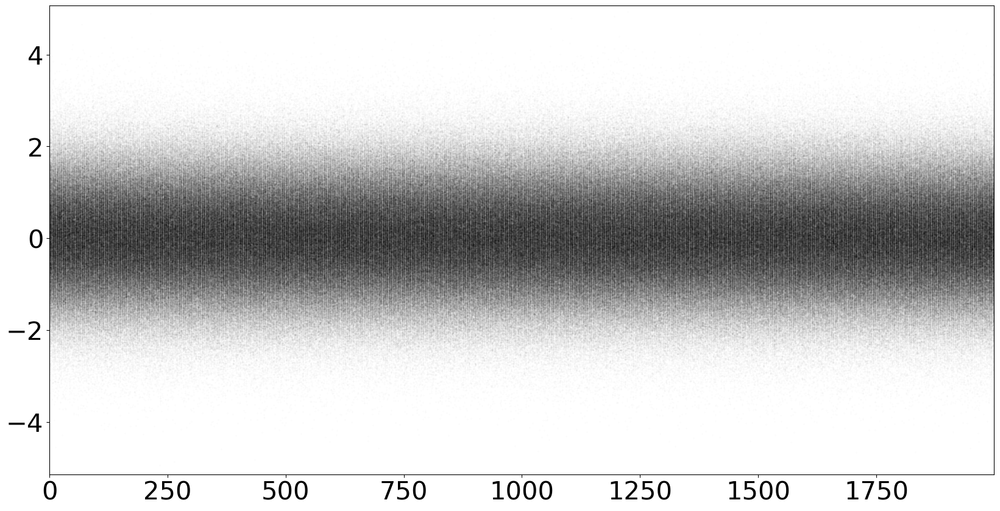

In [2]:
import matplotlib.pyplot as plt
plt.rcParams["axes.xmargin"] = 0
plt.rcParams["axes.ymargin"] = 0
plt.rcParams["font.size"] = 30
fig, ax = plt.subplots(figsize = (20,10))
monte_carlo_sim_df.plot.line(legend = False, ls = "", marker = ".", markersize = .05, color = "k", alpha = .5, ax = ax)
plt.show()

<Axes: >

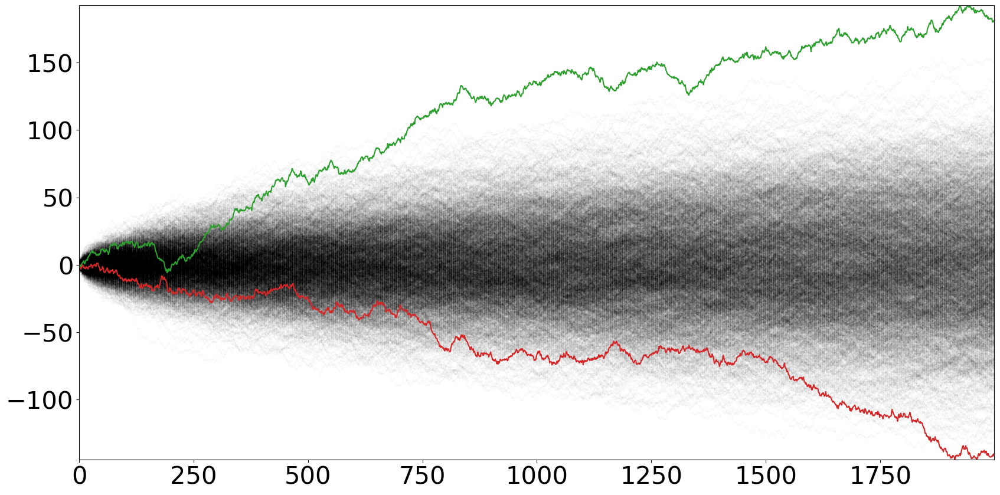

In [3]:
# find the min and max values in the very last period
plot_df = monte_carlo_sim_df.cumsum()
max = plot_df.iloc[-1].max()
min = plot_df.iloc[-1].min()
# find the column with the min and max values
## index of last row refers to the key since key values start at 0
min_key = plot_df.iloc[-1][plot_df.iloc[-1] == min].index
max_key = plot_df.iloc[-1][plot_df.iloc[-1] == max].index

fig, ax = plt.subplots(figsize = (20,10))
plot_df.plot.line(legend = False, ls = "", marker = ".", markersize = .05, color = "k", alpha = .5, ax = ax)
plot_df[min_key].plot.line(legend = False, color = "C3", ax = ax)
plot_df[max_key].plot.line(legend = False, color = "C2", ax = ax)

In [4]:
mean = .05
sigma = .5
monte_carlo_sim_dict = run_monte_carlo(mean, sigma, num_sims, index)
monte_carlo_sim_df = pd.DataFrame(monte_carlo_sim_dict).cumsum()
monte_carlo_sim_df.tail()

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
1995,141.840107,102.107122,98.390797,117.480291,113.679611,114.721383,148.279461,114.390136,95.079031,111.502827,...,84.308868,69.134578,101.411285,115.740514,114.690845,133.588860,115.336457,118.641025,84.651580,109.022298
1996,141.258271,102.123448,97.761268,117.776936,113.431521,114.883645,148.203506,114.406338,94.545782,111.845969,...,84.538317,69.662537,101.038560,115.655342,114.906533,133.275198,115.871737,118.333413,84.631642,108.914179
1997,141.899919,101.883747,97.611092,117.556993,113.839950,113.993493,147.984279,114.682906,94.350181,111.029687,...,84.300451,69.481432,100.730479,116.028880,114.512835,133.435761,115.923310,117.830728,84.536846,108.794930
1998,143.006819,101.454218,97.911542,117.345287,113.923758,114.259053,148.083545,114.104151,93.498062,111.805218,...,84.827841,70.271391,100.950109,116.312335,113.968542,133.726795,115.623856,116.932854,84.956279,108.356009
1999,143.193671,101.330555,97.302519,117.903467,113.839240,113.428799,149.236087,114.036318,92.881172,111.855142,...,85.225522,69.855794,100.993126,115.487276,114.117548,133.768533,115.991915,117.335106,85.428721,107.852833


24.9785753547826 min 24.9785753547826
172.77899971623202 max 172.77899971623202


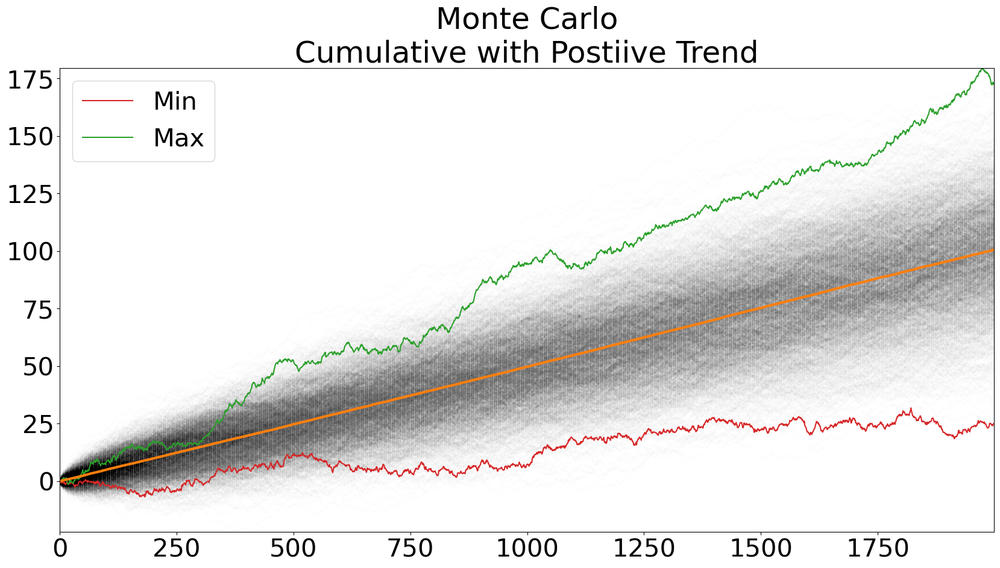

In [5]:
def plot_monte_carlo_sim(sim_data, title = None, logy = True, show_min=False, show_max=False):
    # calculate mean value by period
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (20,10))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
        legend = False, ls = "", marker = ".", markersize = .2, color = "k",
        alpha = .05, logy = logy, ax = ax)

    for i, minmax in enumerate((show_min, show_max)):
        if minmax == True: 
            minmax_str = ["min", "max"][i]
            minmax = getattr(sim_data.iloc[-1], minmax_str)()
            minmax_key = sim_data.iloc[-1][sim_data.iloc[-1] == minmax].index   
            print(minmax, minmax_str, minmax)
            sim_data.plot.line(y = minmax_key, legend = True, label = [minmax_str.title()], color = f"C{3 - i}", ax = ax)
    # prett
    # if show_max:
    #     max = sim_data.iloc[-1].max()
    #     max_key = sim_data.iloc[-1][sim_data.iloc[-1] == max].index    
    #     sim_data.plot.line(y = max_key, legend = True,label = ["Best"], color = "C2", ax = ax)
    # if show_min:
    #     min = sim_data.iloc[-1].min()
    #     min_key = sim_data.iloc[-1][sim_data.iloc[-1] == min].index    
    #     sim_data.plot.line(y = min_key, legend = True, label = ["Worst"], color = "C3", ax = ax)

        
    sim_data["mean"].plot.line(color = "C1", linewidth = 3,
                               logy = logy, ax = ax)
    ax.set_title(title)
    plt.show()
    plt.close()

plot_monte_carlo_sim(monte_carlo_sim_df,
                     title = "Monte Carlo\nCumulative with Postiive Trend", logy = False, show_min = True, show_max = True)

In [6]:
getattr(monte_carlo_sim_df.iloc[-1], "max")()
# monte_carlo_sim_df.iloc[-1].max()

172.77899971623202

In [8]:
#!pip install pandas_datareader

  Obtaining dependency information for pandas_datareader from https://files.pythonhosted.org/packages/3f/16/56c9d648b503619ebe96f726b5f642b68e299b34162ed2d6faa9d7966b7d/pandas_datareader-0.10.0-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/109.5 kB ? eta -:--:--
   ---------------------------------------- 0.0/109.5 kB ? eta -:--:--
   --- ------------------------------------ 10.2/109.5 kB ? eta -:--:--
   -------------- ------------------------ 41.0/109.5 kB 393.8 kB/s eta 0:00:01
   ----------------------------------- -- 102.4/109.5 kB 737.3 kB/s eta 0:00:01
   -------------------------------------- 109.5/109.5 kB 708.7 kB/s eta 0:00:00


In [10]:
#!pip install yfinance

  Obtaining dependency information for yfinance from https://files.pythonhosted.org/packages/d5/b5/70bb98ee38ce532ee29fab76fb668382291fe6e1aa69a8c1ac7e6bc108e7/yfinance-0.2.38-py2.py3-none-any.whl.metadata
  Obtaining dependency information for multitasking>=0.0.7 from https://files.pythonhosted.org/packages/3e/8a/bb3160e76e844db9e69a413f055818969c8acade64e1a9ac5ce9dfdcf6c1/multitasking-0.0.11-py3-none-any.whl.metadata
     ---------------------------------------- 0.0/315.3 kB ? eta -:--:--
     - -------------------------------------- 10.2/315.3 kB ? eta -:--:--
     ---- -------------------------------- 41.0/315.3 kB 653.6 kB/s eta 0:00:01
     ------------------ ------------------- 153.6/315.3 kB 1.5 MB/s eta 0:00:01
     -------------------------------------  307.2/315.3 kB 2.1 MB/s eta 0:00:01
     -------------------------------------- 315.3/315.3 kB 1.8 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Gettin

In [11]:
import pandas_datareader.data as web
import datetime
import yfinance as yf
yf.pdr_override()

In [12]:
start = datetime.datetime(2005,1,1)
end = datetime.datetime.today()
data_dict = {}
stocks = "MSFT", "AAPL", "IBM", "GOOG"
for name in stocks:
    data_dict[name] = web.get_data_yahoo(name, start, end)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [13]:
close_data_dict = {key:val["Close"] for key, val in data_dict.items()}
close_data_df = pd.DataFrame(close_data_dict)
close_data_df.tail()

,MSFT,AAPL,IBM,GOOG
Date,,,,
2024-04-25,399.040009,169.889999,168.910004,157.949997
2024-04-26,406.320007,169.300003,167.130005,173.690002
2024-04-29,402.250000,173.500000,167.429993,167.899994
2024-04-30,389.329987,170.330002,166.199997,164.639999
2024-05-01,394.940002,169.300003,164.429993,165.570007


In [14]:
close_data_pct_change = close_data_df.pct_change()
close_data_pct_change.tail()


,MSFT,AAPL,IBM,GOOG
Date,,,,
2024-04-25,-0.024495,0.005147,-0.082510,-0.019553
2024-04-26,0.018244,-0.003473,-0.010538,0.099652
2024-04-29,-0.010017,0.024808,0.001795,-0.033335
2024-04-30,-0.032119,-0.018271,-0.007346,-0.019416
2024-05-01,0.014409,-0.006047,-0.010650,0.005649


In [15]:
close_data_normalized = close_data_pct_change.add(1).cumprod()
close_data_normalized.fillna(1, inplace = True)
close_data_normalized.head()

,MSFT,AAPL,IBM,GOOG
Date,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499
2005-01-05,1.001496,1.019118,0.987212,0.954615
2005-01-06,1.000374,1.019908,0.984143,0.930146
2005-01-07,0.997382,1.094169,0.979847,0.956292


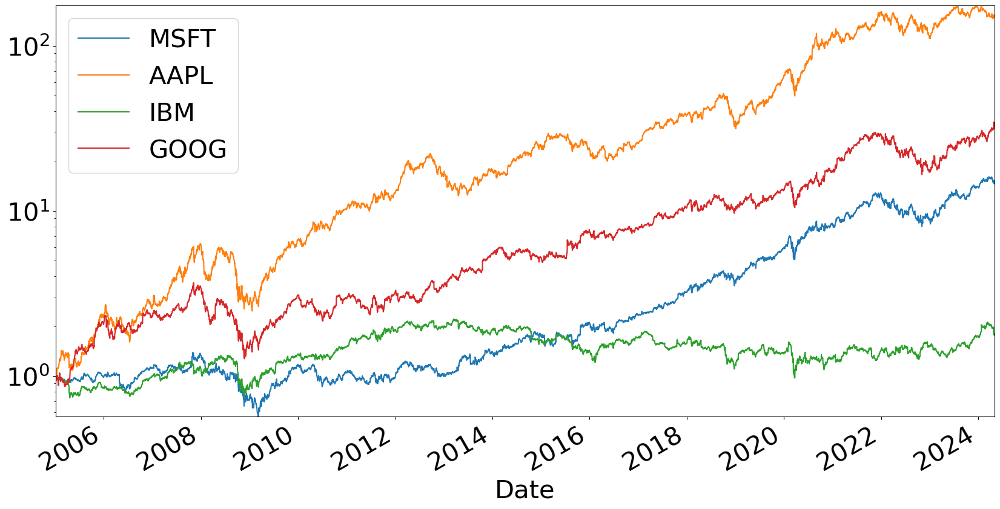

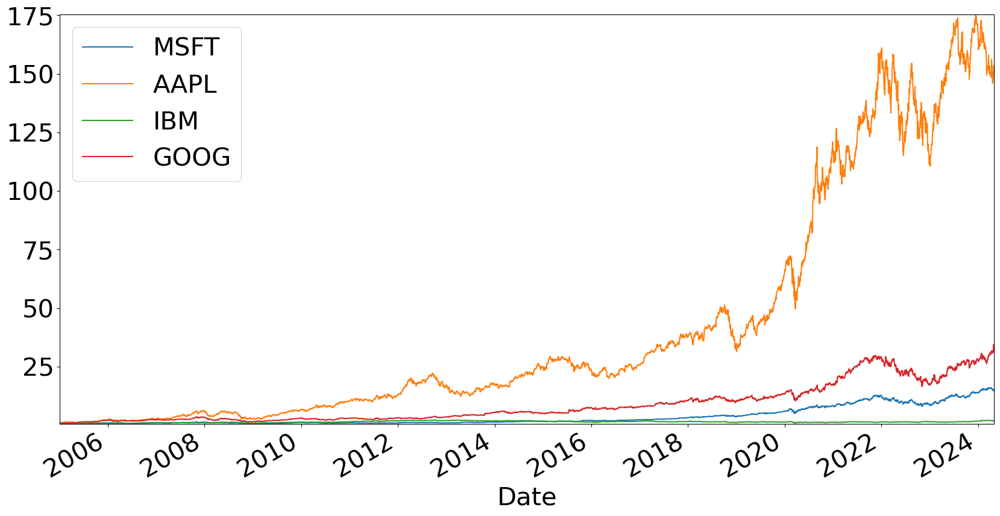

In [16]:
for log in (True, False):
    fig, ax = plt.subplots(figsize = (20,10))
    close_data_normalized.plot.line(ax = ax, logy = log)
    plt.show()
    plt.close()

DAILY rATE OF RETURN

In [17]:
mean_var_df = pd.DataFrame(
    {"mean": close_data_normalized.iloc[-1].div(close_data_normalized.iloc[0]) ** (
        1 / close_data_normalized.shape[0]) - 1,
     "sigma": close_data_pct_change.std()})
mean_var_df

,mean,sigma
MSFT,0.000554,0.017240
AAPL,0.001030,0.020422
IBM,0.000116,0.014477
GOOG,0.000718,0.019001


In [18]:
num_sims = 500
dates = list(close_data_normalized.index)
monte_carlo_sim_dict = {}
for stock in stocks:
    mean = mean_var_df["mean"][stock]
    sigma = mean_var_df["sigma"][stock]
    monte_carlo_sim_dict[stock] = run_monte_carlo(mean,
                                                  sigma,
                                                  num_sims,
                                                  dates)
monte_carlo_sim_dfs = {stock: pd.DataFrame(monte_carlo_sim_dict[stock]).add(1).cumprod() for stock in stocks}

0.21904786100315185 min 0.21904786100315185
404.15838380340966 max 404.15838380340966


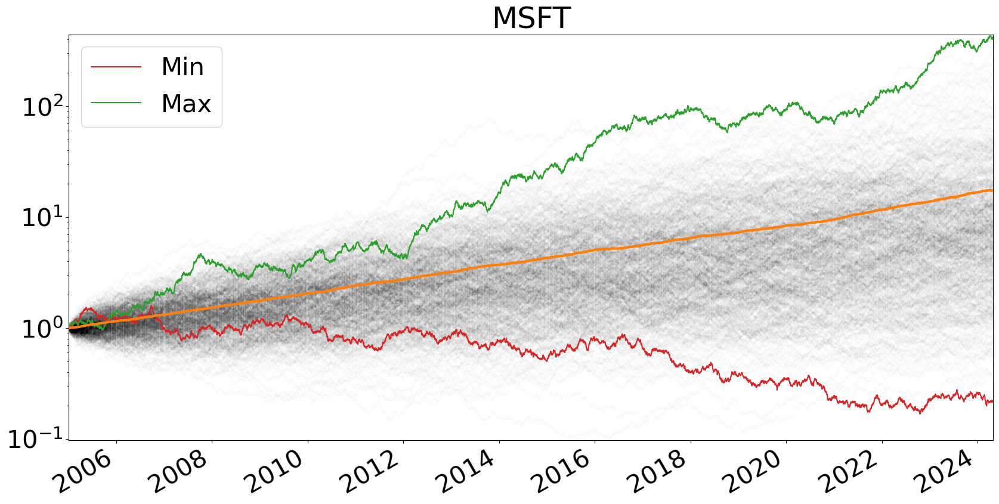

0.9003676530825566 min 0.9003676530825566
1543.9673297478685 max 1543.9673297478685


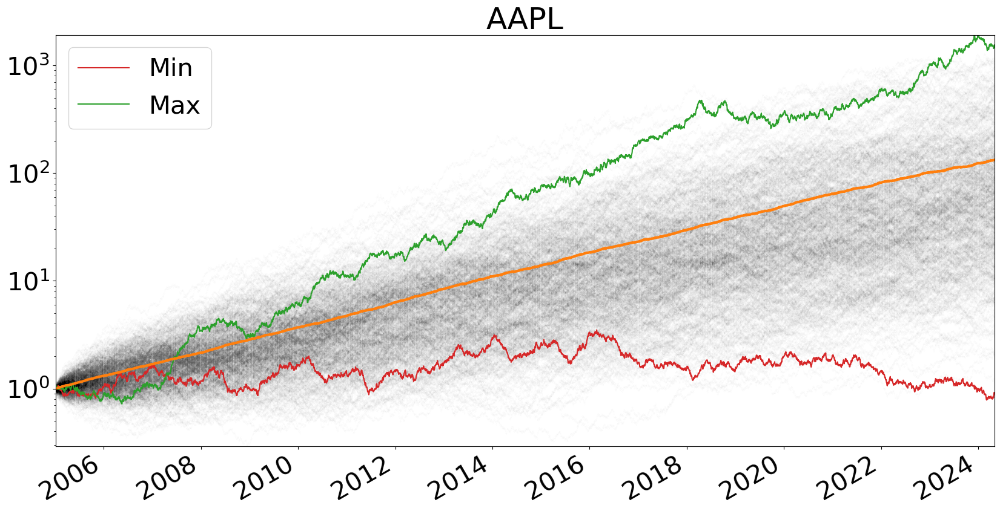

0.06050064928278977 min 0.06050064928278977
14.423273525452387 max 14.423273525452387


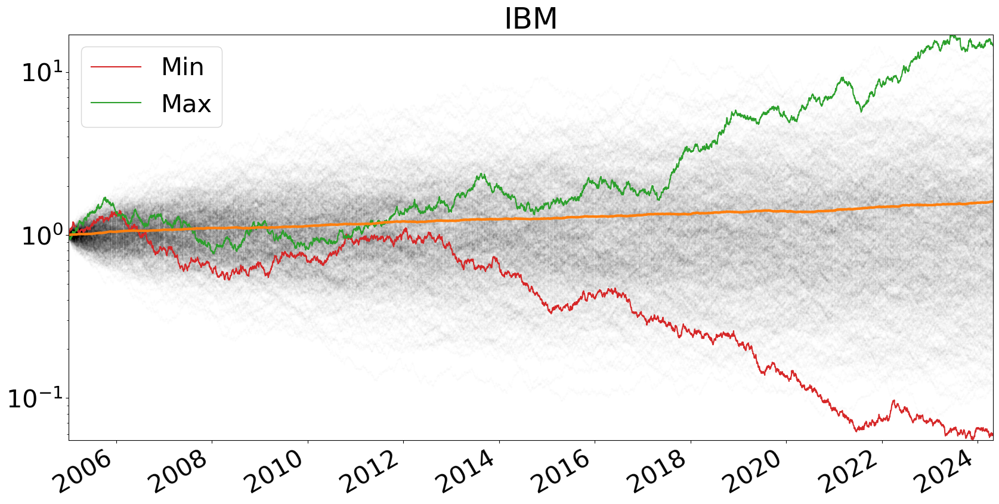

0.3131980615715857 min 0.3131980615715857
2378.8720911777614 max 2378.8720911777614


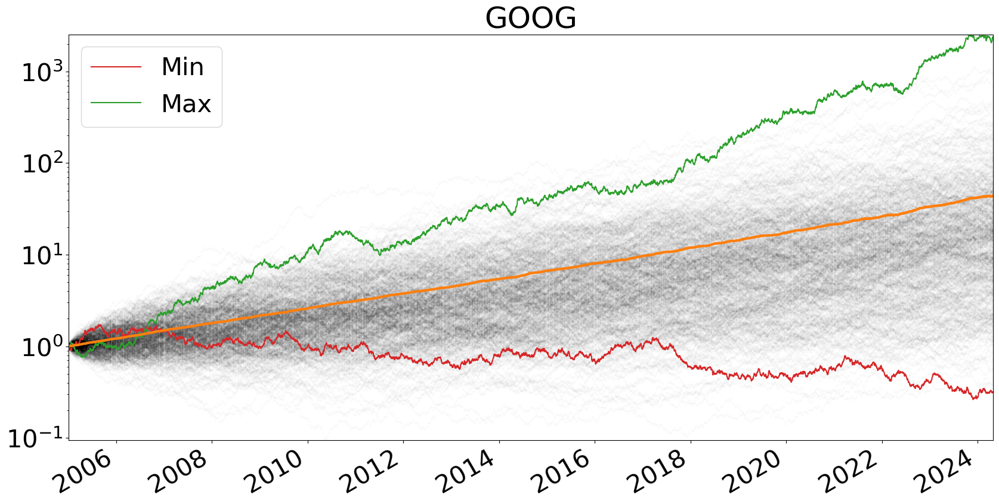

In [19]:
for stock, sim_data in monte_carlo_sim_dfs.items():
    plot_monte_carlo_sim(sim_data, title = stock, logy = True, show_min=True, show_max=True)

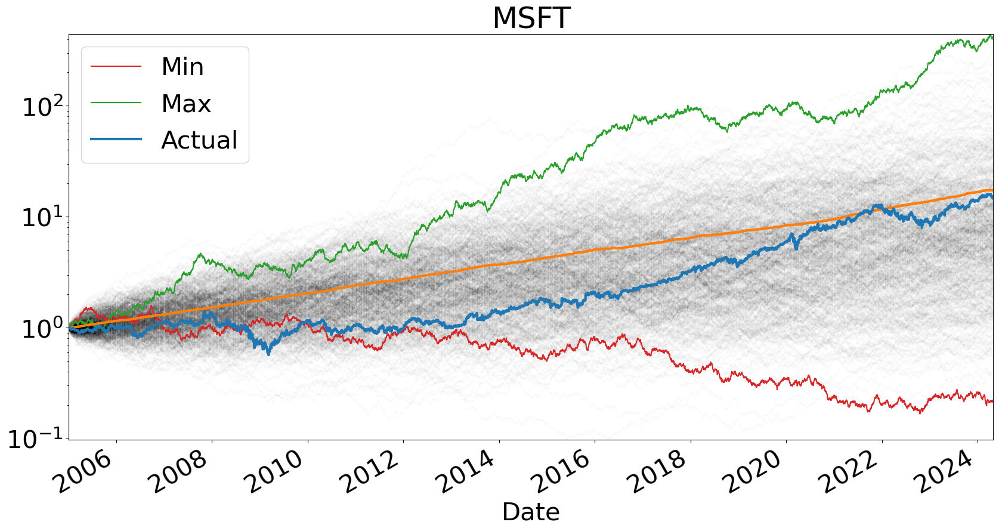

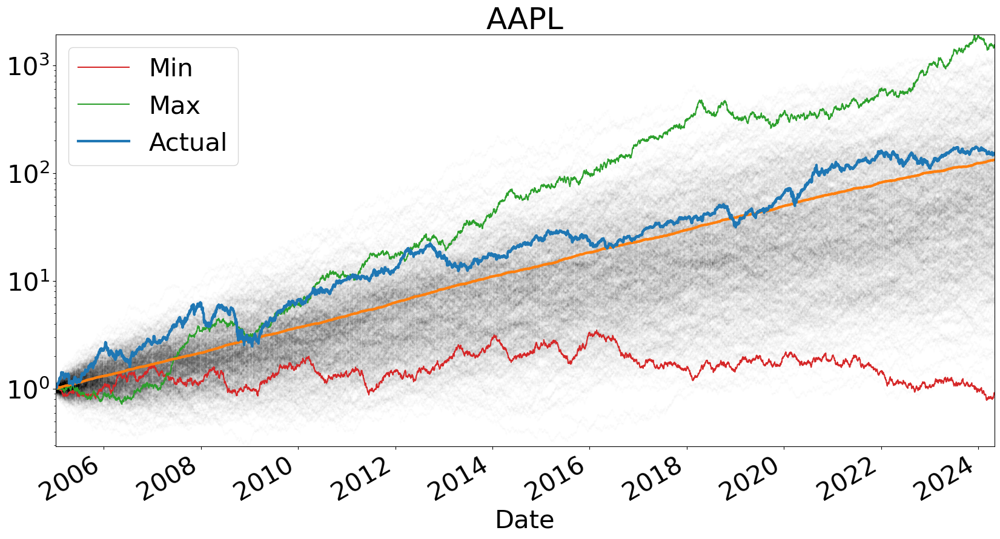

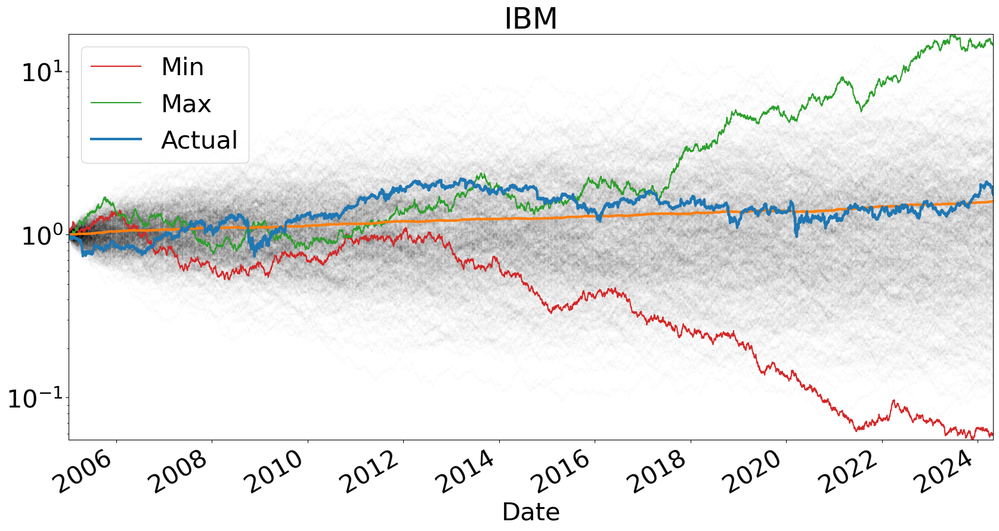

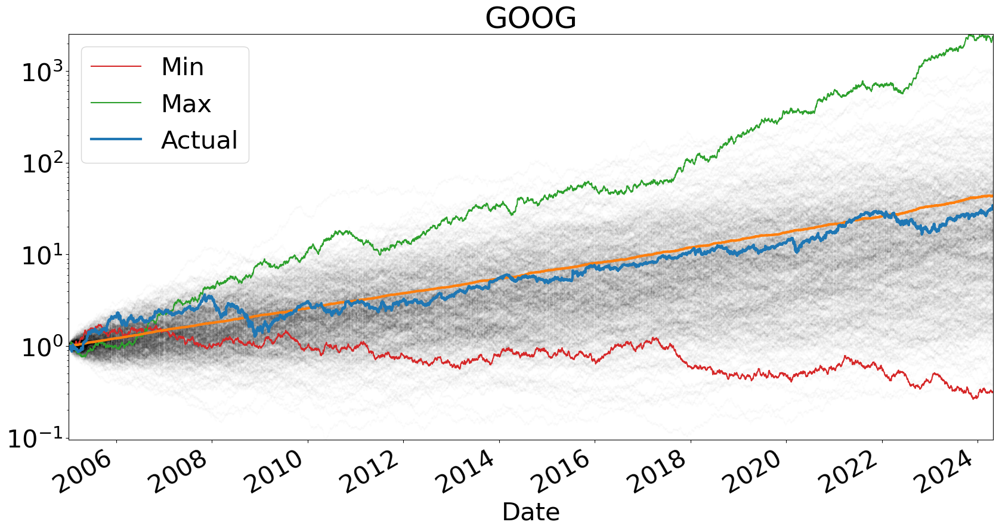

In [20]:
def plot_monte_carlo_sim(sim_data, close_data, stock = None, logy = True, show_min=False, show_max=False):
    # calculate mean value by period
    sim_data["mean"] = sim_data.mean(axis=1)
    fig, ax = plt.subplots(figsize = (20,10))
    sim_data.drop("mean", inplace = False, axis = 1).plot.line(
        legend = False, ls = "", marker = ".", markersize = .2, color = "k",
        alpha = .05, logy = logy, ax = ax)

    for i, minmax in enumerate((show_min, show_max)):
        if minmax == True: 
            minmax_str = ["min", "max"][i]
            minmax = getattr(sim_data.iloc[-1], minmax_str)()
            minmax_key = sim_data.iloc[-1][sim_data.iloc[-1] == minmax].index   
            sim_data.plot.line(y = minmax_key, legend = True, label = [minmax_str.title()], color = f"C{3 - i}", ax = ax)
        
    sim_data["mean"].plot.line(color = "C1", linewidth = 3,
                               logy = logy, ax = ax)
    close_data[stock].plot.line(color = "C0", linewidth = 3,
                               logy = logy, legend=True, label="Actual", ax = ax)
    ## consistent with minmax approach...
    # close_data.plot.line(y = stock, color = "C0", linewidth = 3,
    #                        logy = logy, legend=True, label=["Actual"], ax = ax)
    ax.set_title(stock)
    # ax.legend(ncols=2, loc = "upper left")
    plt.show()
    plt.close()
    
for stock, sim_data in monte_carlo_sim_dfs.items():
    plot_monte_carlo_sim(sim_data, close_data_normalized, stock = stock, logy = True, show_min=True, show_max=True)

In [21]:
portfolio_weights = {stock: 1 / len(stocks) for stock in stocks}
portfolio_weights


{'MSFT': 0.25, 'AAPL': 0.25, 'IBM': 0.25, 'GOOG': 0.25}

In [22]:
ex_return = pd.DataFrame(close_data_normalized.apply(lambda x: x.mul(portfolio_weights[x.name]),
                                                     axis = 0).sum(axis = 1), columns = ["Portfolio Return"])
close_data_normalized["Portfolio Return"] = ex_return.copy()
close_data_normalized

# apply() sum of weights for each row

,MSFT,AAPL,IBM,GOOG,Portfolio Return
Date,,,,,
2005-01-03,1.000000,1.000000,1.000000,1.000000,1.000000
2005-01-04,1.003740,1.010270,0.989258,0.959499,0.990692
2005-01-05,1.001496,1.019118,0.987212,0.954615,0.990610
2005-01-06,1.000374,1.019908,0.984143,0.930146,0.983643
2005-01-07,0.997382,1.094169,0.979847,0.956292,1.006923
...,...,...,...,...,...
2024-04-25,14.922962,150.321314,1.807467,31.284499,49.584060
2024-04-26,15.195214,149.799276,1.788419,34.402056,50.296241
2024-04-29,15.043007,153.515499,1.791629,33.255253,50.901347


Text(0.5, 1.0, 'Portfolio Return')

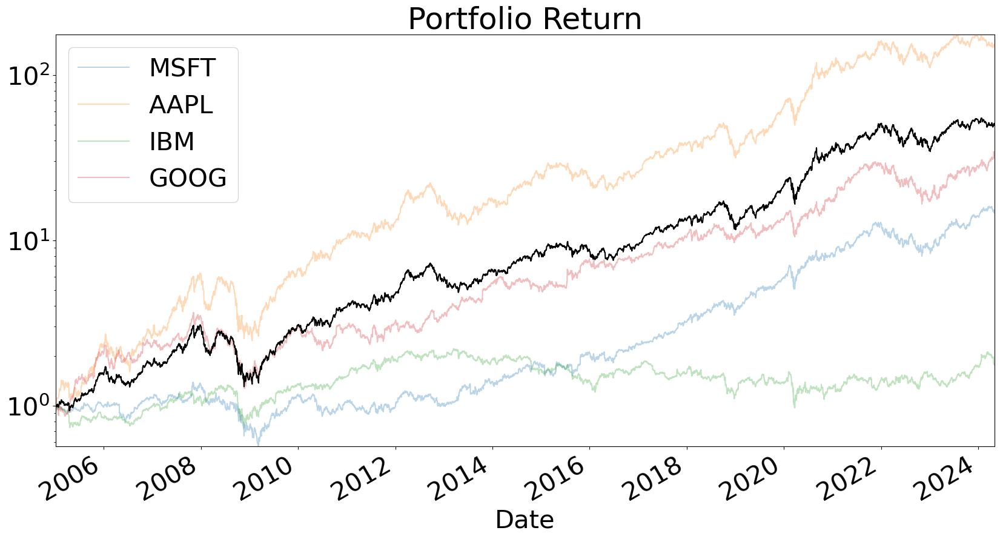

In [23]:
fig, ax = plt.subplots(figsize = (20,10))
close_data_normalized.drop("Portfolio Return", axis = 1).plot.line(legend = True,
                                                                   logy = True, 
                                                                   alpha = .3,
                                                                   # color = "k",
                                                                   ax = ax)
close_data_normalized[["Portfolio Return"]].plot.line(legend = False,
                                                      logy = True,
                                                      color = "k",
                                                      ax = ax)
ax.set_title("Portfolio Return")

In [24]:
# build portfolio percent change since we constructed portfolio variable
## from cumulative products
ex_return_pct_change = ex_return.pct_change()
ex_return_pct_change.dropna(inplace = True)
mean_var_df = pd.DataFrame({"mean": (ex_return.iloc[-1] / ex_return.iloc[0]) ** (
    1 / ex_return.shape[0]) - 1,
                            "sigma": ex_return_pct_change.std()})
mean_var_df

,mean,sigma
Portfolio Return,0.000804,0.016551


In [25]:
num_sims = 1000
dates = ex_return.index
mean = mean_var_df["mean"]["Portfolio Return"]
sigma = mean_var_df["sigma"]["Portfolio Return"]
# monte_carlo_sim_dict = {}
monte_carlo_sim_dict["Portfolio Return"] = run_monte_carlo(mean,
                                              sigma,
                                              num_sims,
                                              dates)
monte_carlo_sim_dfs["Portfolio Return"] = pd.DataFrame(monte_carlo_sim_dict["Portfolio Return"]).add(1).cumprod()
monte_carlo_sim_dfs

{'MSFT':                    0          1         2          3         4          5  \
 2005-01-03  1.009229   0.982364  1.030993   1.010582  0.993749   0.989528   
 2005-01-04  1.022292   0.983923  1.063681   1.014432  1.004371   0.987617   
 2005-01-05  1.040955   1.001937  1.056837   1.005550  1.015916   0.968217   
 2005-01-06  1.023685   1.005236  1.069054   1.017155  1.018392   0.971253   
 2005-01-07  0.998540   1.030644  1.078819   0.975330  1.000687   0.950522   
 ...              ...        ...       ...        ...       ...        ...   
 2024-04-25  2.602716  13.854141  7.796223  43.967966  3.865842  14.362714   
 2024-04-26  2.664738  14.108405  7.749541  44.109683  3.891197  14.022254   
 2024-04-29  2.647978  14.332649  7.711280  43.503703  3.919469  13.783353   
 2024-04-30  2.587675  14.325003  7.544296  43.695090  3.930838  14.289963   
 2024-05-01  2.543220  14.795272  7.532545  43.051821  4.001001  14.629333   
 
                     6          7          8         9